# Convolutional Neural Networks (CNNs) – A Detailed Explanation

## 1. Introduction
Convolutional Neural Networks (CNNs) are a type of deep learning model specifically designed for processing structured grid-like data, such as images. They are widely used in computer vision tasks, including image classification, object detection, and segmentation.

To understand CNNs comprehensively, we need to explore the biological inspiration behind them, starting from **Hubel and Wiesel’s experiment**, and then discuss key components such as **simple and complex neurons, grayscale vs. RGB images, edge detection, convolution operations, filters, padding, pooling, strides, etc.**


Convolutional neural networks (CNNs) are used to solve many computer vision problems, including image recognition, object detection, and image segmentation. <br>
Computer vision problems solved by CNNs:

- Image recognition and classification: CNNs can identify and categorize images.

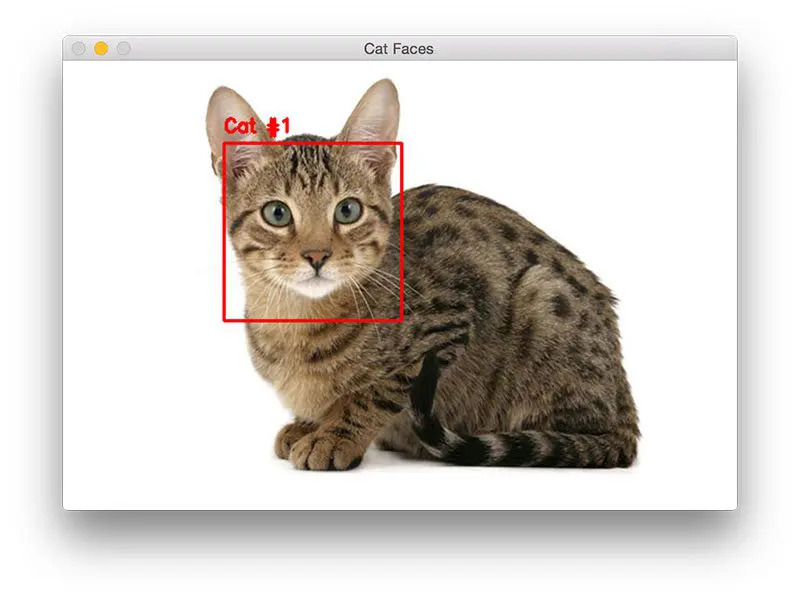

- Object detection: CNNs can locate and identify objects in images and videos.

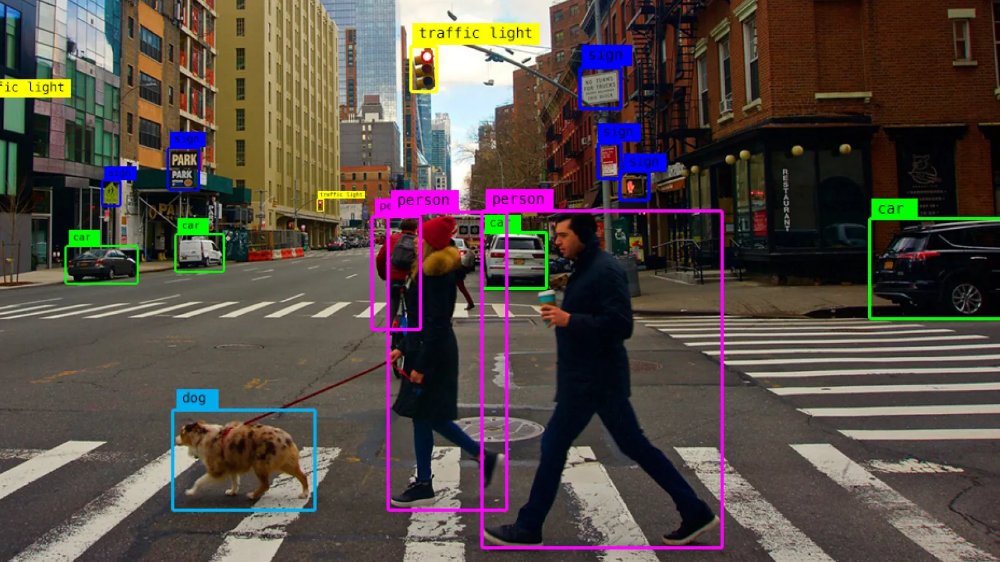

- Image segmentation: CNNs can divide images into different regions and tag each region. 

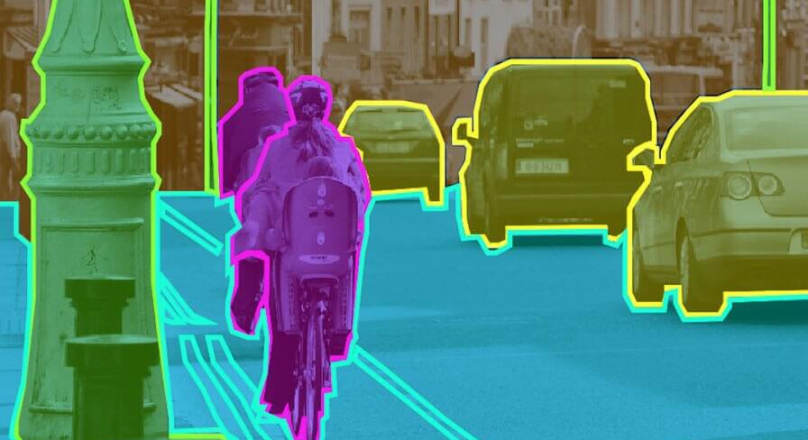

- Image creation: CNNs can create new images or alter existing ones. 

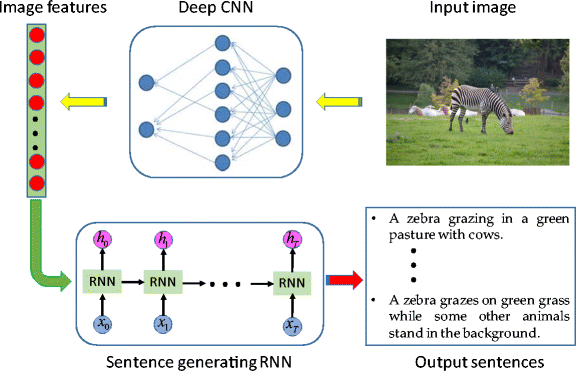


## 2. Biological Inspiration: Hubel & Wiesel’s Cat Experiment (1959-1962)
CNNs were inspired by the way the human visual cortex processes images. The key discovery was made by **David Hubel and Torsten Wiesel** in their famous **cat experiment**.

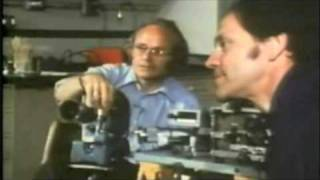

### **2.1 How the Experiment was Performed**
1. **Experimental Setup**  
   - Hubel and Wiesel inserted microelectrodes into the primary visual cortex (**V1**) of a cat.
   - They showed different light patterns and images on a screen in front of the cat while measuring neural activity.

2. **Key Observations**  
   - Some neurons responded only to specific orientations of edges (e.g., vertical or horizontal lines).
   - These neurons were categorized into two types:
     - **Simple Neurons**: Activated by specific edge orientations at a precise location.
     - **Complex Neurons**: Responded to specific edge orientations but were invariant to slight positional changes.

This discovery laid the foundation for **feature extraction in CNNs**, where lower layers detect **simple features like edges**, and deeper layers detect **more complex patterns like shapes and objects**.

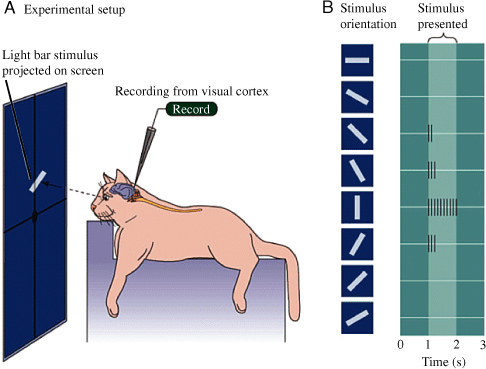

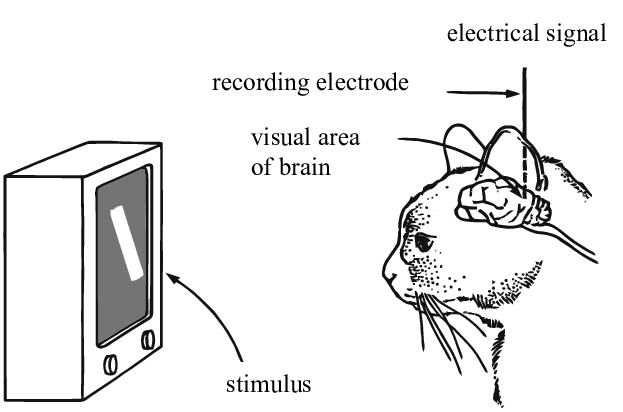


## 3. Simple and Complex Neurons
### **3.1 Simple Neurons (Edge Detectors)**
- These neurons detect **edges** and **lines** at particular orientations.
- They perform a **linear operation** on the input image, meaning they respond to specific spatial locations.
- Mathematically, they can be represented as:
  
  $$
  y = \sum_{i,j} W_{ij} X_{ij} + b
  $$

  where:
  - $X_{ij}$ = pixel values of the input image
  - $W_{ij}$ = weights (which act like edge-detecting filters)
  - $b$ = bias term

### **3.2 Complex Neurons (Higher-Level Features)**
- These neurons **combine simple neuron outputs** to detect patterns regardless of exact position.
- They introduce **spatial invariance**—if an edge shifts slightly, the neuron still activates.
- This behavior is mimicked in CNNs through **pooling layers** (discussed later).

## 4. Grayscale vs. RGB Images
### **4.1 Grayscale Images**
- A grayscale image contains **only one channel** with intensity values ranging from **0 (black) to 255 (white)**.
- It can be represented as a **2D matrix**: <br>
`I = [ [200, 150, 100], [50, 80, 120], [90, 60, 30] ]`

### **4.2 RGB Images**
- An **RGB image** consists of **three color channels**: Red, Green, and Blue.
- Each pixel has **three intensity values**, forming a **3D tensor**. <br>
`I_RGB = [ [R_ij, G_ij, B_ij] ]`

- CNNs handle RGB images by applying convolutions **independently to each channel** and summing the results.


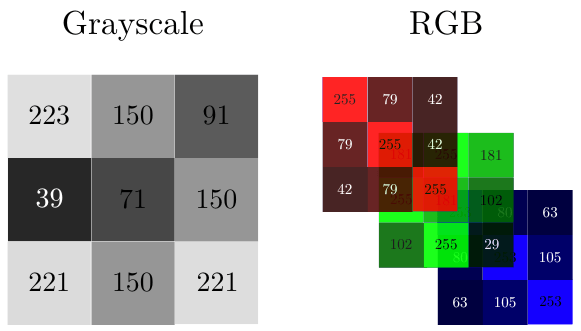

<div class="alert alert-block alert-warning"> <h4>📌 Note : </h4>
<div>

### Why Don't We Use ANN for Image Processing?

Artificial Neural Networks (ANNs) are **not ideal** for image processing due to the following reasons:

#### 1. High Number of Parameters
- An image of size **100 × 100 × 3 (RGB)** has **30,000** inputs.
- A fully connected ANN would require **millions of weights**, making it **computationally expensive**.

#### 2. Loss of Spatial Hierarchy
- ANNs treat all pixels **independently**, ignoring the spatial relationships between neighboring pixels.
- This reduces the model's ability to detect **edges, textures, and patterns**.

#### 3. Translation Variance Issue
- In images, objects can appear at **different positions**, but ANNs do not generalize well to such variations.
- CNNs handle this through **convolutions and pooling**.

#### 4. Inefficient Feature Extraction
- ANNs require **manual feature engineering** before classification.
- CNNs automatically learn **edge, texture, shape, and object** features.

#### 5. Lack of Weight Sharing
- ANNs assign **unique weights** to every pixel, leading to a large parameter space.
- CNNs use **shared filters**, reducing the number of parameters significantly.


ANNs are inefficient for image processing due to their **high computational cost**, **lack of spatial understanding**, and **inability to capture patterns effectively**. Convolutional Neural Networks (CNNs) solve these issues by using **convolutions, weight sharing, and hierarchical feature learning**.

</div>
</div>


## 5. Edge Detection (First Step in Feature Extraction)
Edge detection is a technique used to identify the boundaries of objects within images. It helps in simplifying the image data by reducing the amount of information to be processed while preserving the structural properties of the image. This simplification is essential for various image analysis tasks, including object recognition, segmentation, and image enhancement.

Edge detection is a fundamental image processing technique used to find regions with high intensity variations. Three common filters used for edge detection are **Sobel, Prewitt, and Scharr**. These filters approximate the **gradient** of the image intensity.




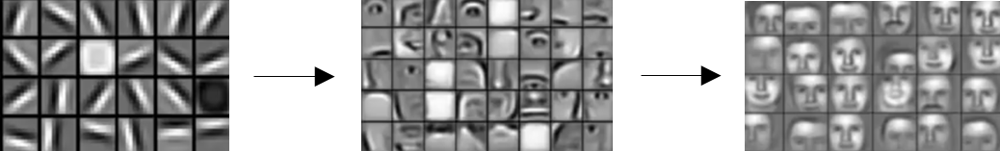

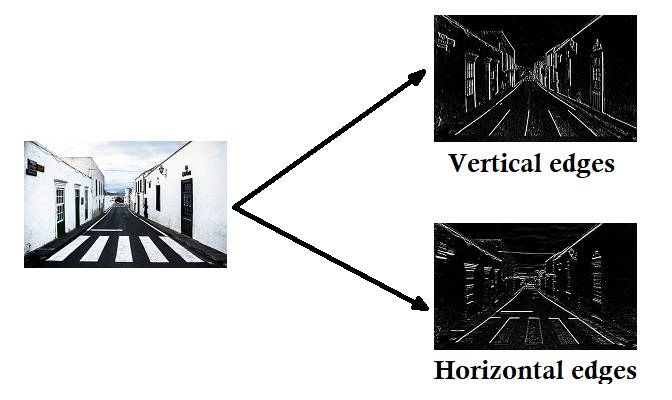

### 5.1 **Sobel Operator**
The Sobel operator applies convolution using two kernels: one for detecting horizontal edges and another for vertical edges.

#### **5.1.1 Sobel Horizontal Edge Filter**
$$
G_x =
\begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

#### **5.1.2 Sobel Vertical Edge Filter**
$$
G_y =
\begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$

#### **5.1.3 Sobel Edge Magnitude**
The overall edge strength is computed as:

$$
G = \sqrt{G_x^2 + G_y^2}
$$

#### **5.1.4 Sobel Diagonal Filters**
To detect diagonal edges, we can combine the horizontal and vertical filters.

$$
G_{diag1} =
\begin{bmatrix}
0 & 1 & 2 \\
-1 & 0 & 1 \\
-2 & -1 & 0
\end{bmatrix}
$$

$$
G_{diag2} =
\begin{bmatrix}
2 & 1 & 0 \\
1 & 0 & -1 \\
0 & -1 & -2
\end{bmatrix}
$$


### 5.2. **Prewitt Operator**
The Prewitt operator is similar to Sobel but gives **equal weights** to adjacent pixels.

#### **5.2.1 Prewitt Horizontal Edge Filter**
$$
G_x =
\begin{bmatrix}
-1 & 0 & 1 \\
-1 & 0 & 1 \\
-1 & 0 & 1
\end{bmatrix}
$$

#### **5.2.2 Prewitt Vertical Edge Filter**
$$
G_y =
\begin{bmatrix}
-1 & -1 & -1 \\
0 & 0 & 0 \\
1 & 1 & 1
\end{bmatrix}
$$

#### **5.2.3 Prewitt Edge Magnitude**
$$
G = \sqrt{G_x^2 + G_y^2}
$$



### 5.3. **Scharr Operator**
The Scharr operator is an improved version of Sobel with better rotational symmetry.

#### **5.3.1 Scharr Horizontal Edge Filter**
$$
G_x =
\begin{bmatrix}
-3 & 0 & 3 \\
-10 & 0 & 10 \\
-3 & 0 & 3
\end{bmatrix}
$$

#### **5.3.2 Scharr Vertical Edge Filter**
$$
G_y =
\begin{bmatrix}
-3 & -10 & -3 \\
0 & 0 & 0 \\
3 & 10 & 3
\end{bmatrix}
$$

#### **5.3.3 Scharr Edge Magnitude**
$$
G = \sqrt{G_x^2 + G_y^2}
$$



### **Comparison of Filters**
| Operator  | Horizontal Weighting | Vertical Weighting | Sensitivity |
|--|-|--|-|
| **Sobel** | Weighted (2 in center row) | Weighted (2 in center column) | Medium |
| **Prewitt** | Equal weights | Equal weights | Less sensitive than Sobel |
| **Scharr** | Stronger weighting (10 in center row) | Stronger weighting (10 in center column) | Most accurate for detecting edges |

Scharr is **more precise** but computationally expensive, whereas Sobel is a good balance between **speed and accuracy**.



## 6. Convolution Operation in CNN
Convolution is the core operation in CNNs that extracts spatial features from images.

The convolution operation in image processing is a mathematical process that uses a filter kernel to calculate the weighted sum of neighboring pixels. This operation is used to perform tasks like sharpening, blurring, and edge enhancement. 



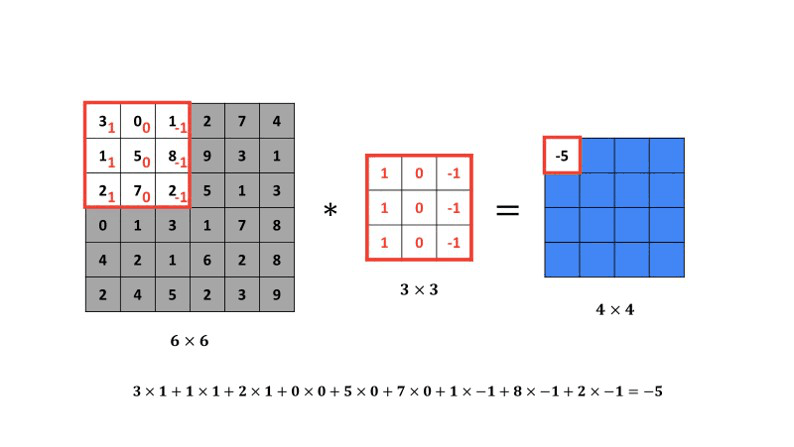

### 6.1 Definition (Mathematical Formulation)
Given an input image $I$ (size: $N \times N$) and a filter/kernel $K$ (size: $F \times F$), the convolution operation computes:

$
O(i,j) = \sum_{m=0}^{F-1} \sum_{n=0}^{F-1} I(i+m, j+n) K(m,n)
$

where:
- $O(i,j)$ is the output feature map.
- $K$ is a **small filter/kernel** (e.g., $3 \times 3$ or $5 \times 5$).
- The filter slides across the image, performing an **element-wise multiplication** followed by summation.



### 6.2 Output Size Calculation
The output size of the feature map depends on:
- Input size: $N \times N$
- Kernel (filter) size: $F \times F$
- Stride: $S$ (step size of the filter movement)
- Padding: $P$ (extra pixels added around the image)

$$O = N - F + 1$$


#### Case 1: Without Padding ("Valid" Convolution)
$
O = \frac{N - F}{S} + 1
$

For example, if:
- Input size $N = 5$
- Kernel size $F = 3$
- Stride $S = 1$

$
O = \frac{5 - 3}{1} + 1 = 3
$

#### Case 2: With Padding ("Same" Convolution)
If padding $P$ is used, the output size is:

$
O = \frac{N - F + 2P}{S} + 1
$

Padding ensures that the output size remains the same as the input size when $S = 1$, which is often desirable in deep CNNs.

For example, if:
- Input size $N = 5$
- Kernel size $F = 3$
- Padding $P = 1$
- Stride $S = 1$

$
O = \frac{5 - 3 + 2(1)}{1} + 1 = 5
$

This keeps the output size the same as the input size.


### 6.3 Multiple Filters in CNN
Each CNN layer applies multiple filters to learn different feature maps:

$
O_k = I \ast K_k
$

where $k$ indexes different filters.

In a CNN, the first layers detect **edges** and **textures**, while deeper layers detect **more complex structures**.


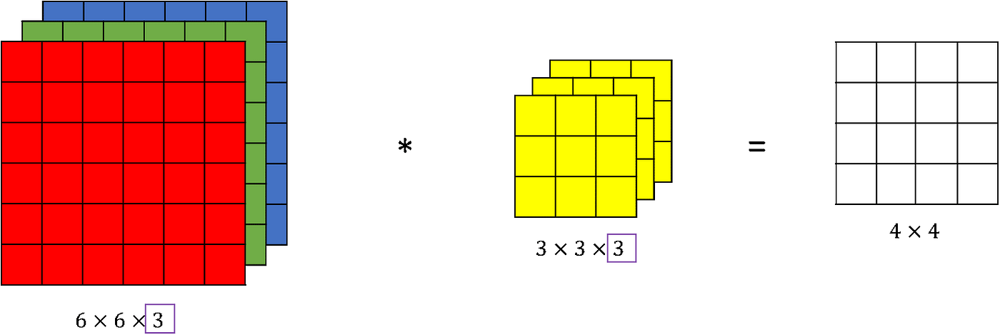

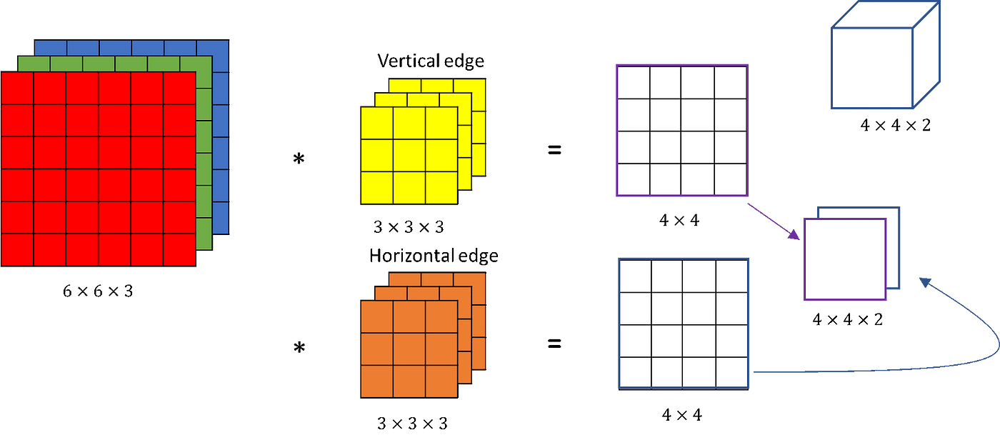

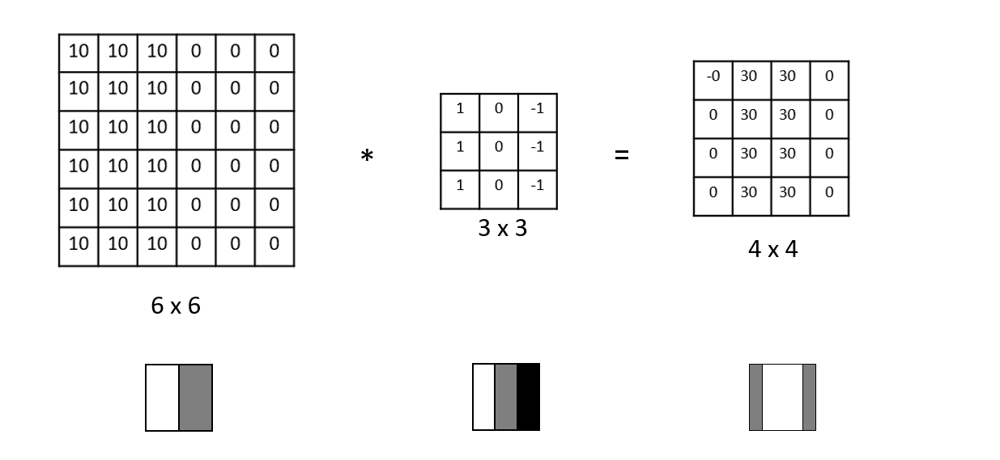

## 7. Why Do We Use Padding and Strides in CNNs?

  ### 7.1. Why Use **Padding**?
  Padding is used in CNNs to control the spatial dimensions of the output feature map. There are three main reasons for using padding:

  #### **7.1.1 Preserve Spatial Dimensions ("Same" Convolution)**
  - When applying convolution, the output size **shrinks** because the filter does not cover the border pixels completely.
  - To maintain the same input and output dimensions, we add **zero-padding** around the input.

  Example:
  - If input size $N = 5$, kernel size $F = 3$, and stride $S = 1$:
    - **Without padding:** $O = 5 - 3 + 1 = 3$ (Output shrinks)
    - **With padding $P = 1$:** $O = 5 - 3 + 2(1) + 1 = 5$ (Size is preserved)

  #### **7.1.2 Prevent Information Loss (Border Pixels)**
  - Without padding, **border pixels get fewer updates**, leading to **loss of edge details**.
  - Padding ensures that every pixel in the input contributes **equally** to feature extraction.

  #### **7.1.3 Allow Use of Larger Filters**
  - Without padding, using a large filter on a small image **reduces the output size too quickly**.
  - Padding allows deeper networks to extract meaningful features.


### 7.2. Why Use **Strides**?
Strides control how much the filter moves at each step. The main reasons for using strides are:

#### **7.2.1 Reduce Computational Cost**
- With **stride = 1**, the filter moves pixel-by-pixel, producing a large feature map.
- With **stride = 2 or more**, the filter skips pixels, **reducing the output size** and the number of computations.

Example:
- If input size $N = 7$, kernel size $F = 3$, and:
  - **Stride $S = 1$**: $O = \frac{7 - 3}{1} + 1 = 5$
  - **Stride $S = 2$**: $O = \frac{7 - 3}{2} + 1 = 3$

#### **7.2.2 Downsampling Without Pooling**
- A larger stride **reduces the feature map size**, similar to **max pooling**.
- This helps in building **efficient deep networks**.

#### **7.2.3 Helps in Multi-Scale Feature Extraction**
- Different strides allow detecting patterns at **various scales**.
- Smaller strides capture **fine details**, while larger strides focus on **coarse structures**.



## Basic Pooling Parameters in CNN

Pooling is used in Convolutional Neural Networks (CNNs) to reduce the spatial dimensions of feature maps while retaining important information. The key pooling parameters are:

### 1. **Pooling Type**
   - **Max Pooling**: Takes the maximum value from the region.
 

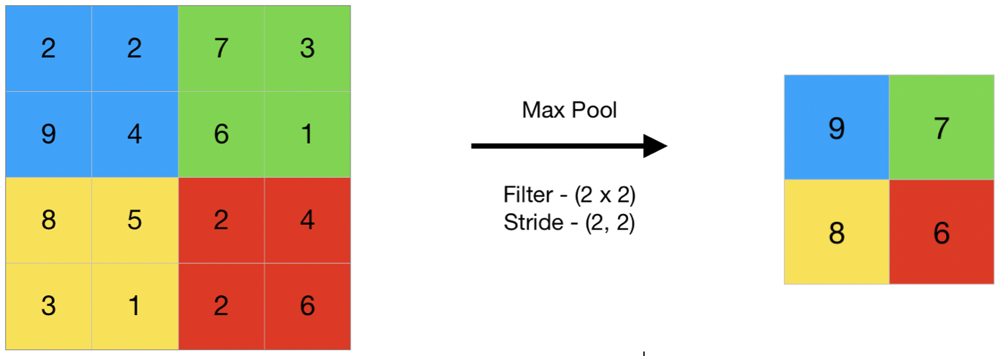

  - **Average Pooling**: Takes the average of all values in the region.

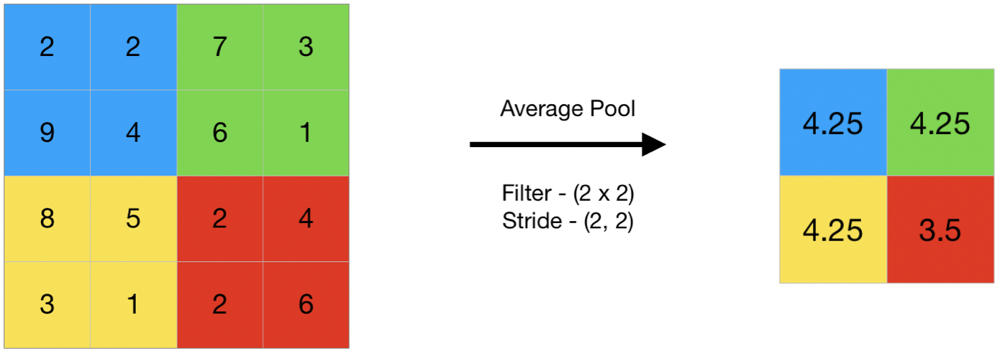

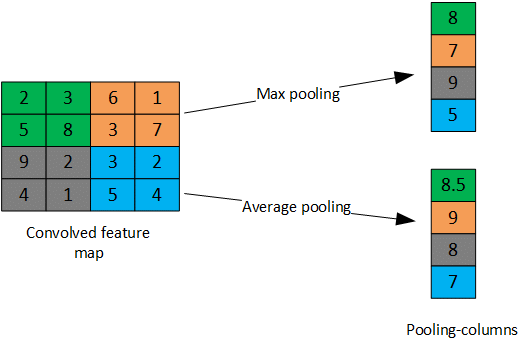

- **Min Pooling** - Takes the minimum value from the region.

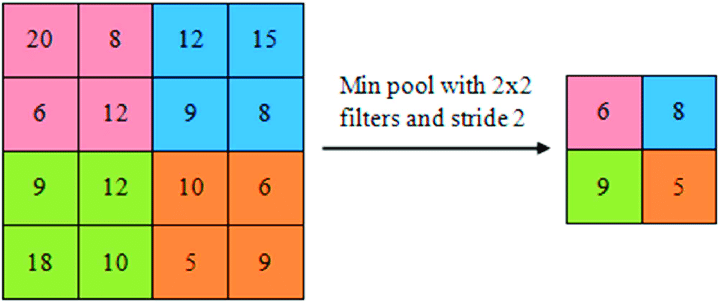

- **Global Pooling**: Applies pooling over the entire feature map (used before fully connected layers).

   When we pass our data to fully connected layers, instead of flatten, we use global pooling to reduce overfitting.


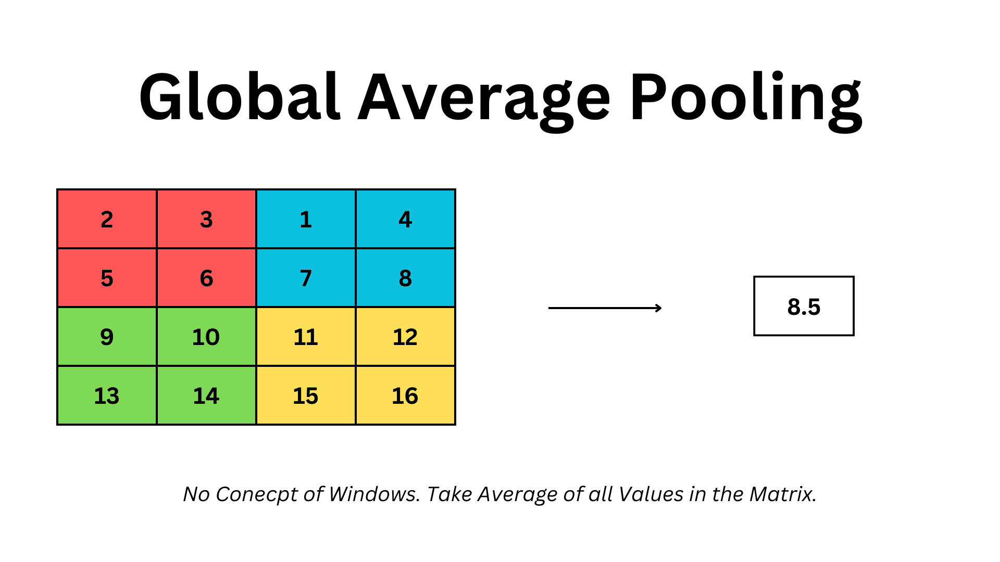

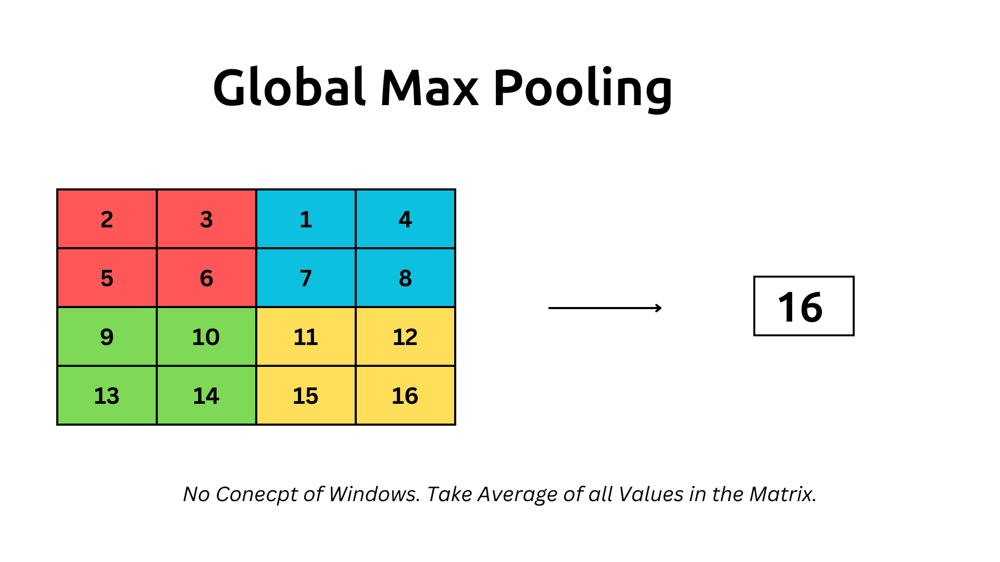

### 2. **Pool Size (Filter Size)**
   - Defines the dimensions of the pooling window.
   - Common sizes: $2 \times 2$, $3 \times 3$.

### 3. **Stride (S)**
   - Determines how far the pooling window moves at each step.
   - Common values: $S = 1$ (overlapping pooling), $S = 2$ (non-overlapping pooling).

### 4. **Padding (P)**
   - Rarely used in pooling, but if applied, it adds extra pixels to the feature map edges.

### 5. **Output Size Formula**
   The output size $O$ for a given input size $N$, pool size $F$, stride $S$, and padding $P$ is:

   $$
   O = \frac{N - F + 2P}{S} + 1
   $$



#### **Example Calculation**
If input size = **32 × 32**, pool size = **2 × 2**, stride = **2**, and padding = **0**:

$$
O = \frac{32 - 2 + 2(0)}{2} + 1 = 16
$$

So, the output feature map will be **16 × 16**.

Pooling helps in **reducing computation, controlling overfitting, and improving feature robustness**.



### 6. **Mode (Ceil or Floor)**
   - **Floor Mode** (default): Rounds output size down.
   - **Ceil Mode**: Rounds output size up (ensures no data loss for uneven divisions).

### 7. **Dimensionality**
   - **1D Pooling**: Used for sequential data (e.g., audio, text).
   - **2D Pooling**: Used for images (standard case).
   - **3D Pooling**: Used for volumetric data (e.g., medical imaging).

#### **Common Hyperparameter Choices**
| Hyperparameter | Typical Values |
|||
| Pooling Type  | Max, Average |
| Pool Size $F$ | $2 \times 2$, $3 \times 3$ |
| Stride $S$ | 1, 2 |
| Padding $P$ | 0 (default) |
| Mode | Floor (default), Ceil (optional) |
| Dimensionality | 1D, 2D, 3D |

These hyperparameters control **how pooling reduces feature map size**, influencing **model efficiency and performance**.

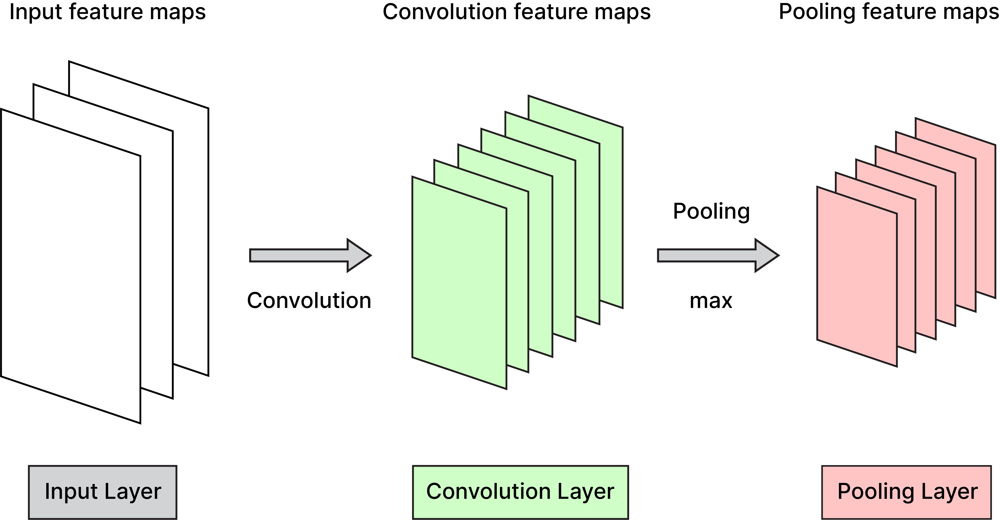

We cannot say that a particular pooling method is better over other generally. The choice of pooling operation is made based on the data at hand. Average pooling method smooths out the image and hence the sharp features may not be identified when this pooling method is used.

Max pooling selects the brighter pixels from the image. It is useful when the background of the image is dark and we are interested in only the lighter pixels of the image. 

Min Pooling is useful when the background of the image is dark and we are interested in only the lighter pixels of the image

For example: in MNIST dataset, the digits are represented in white color and the background is black. So, max pooling is used. Similarly, min pooling is used in the other way round.

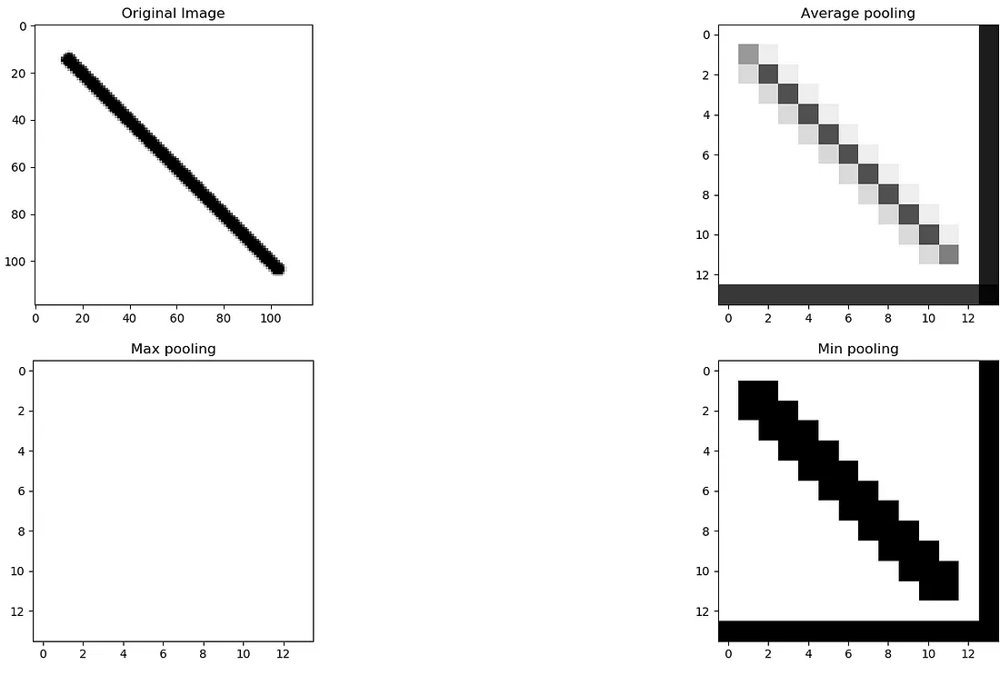

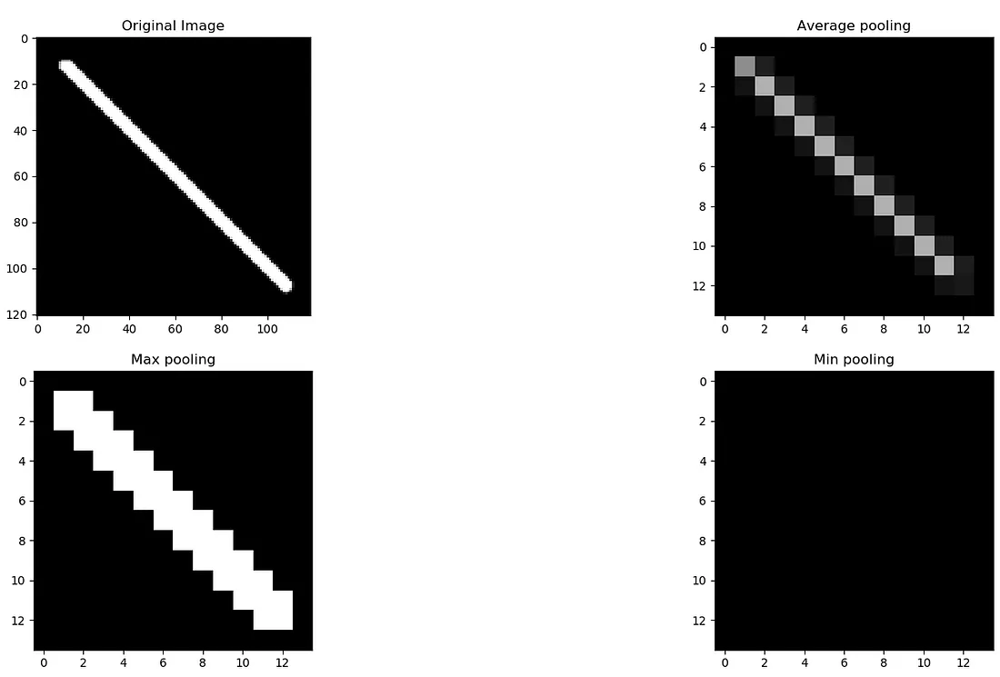

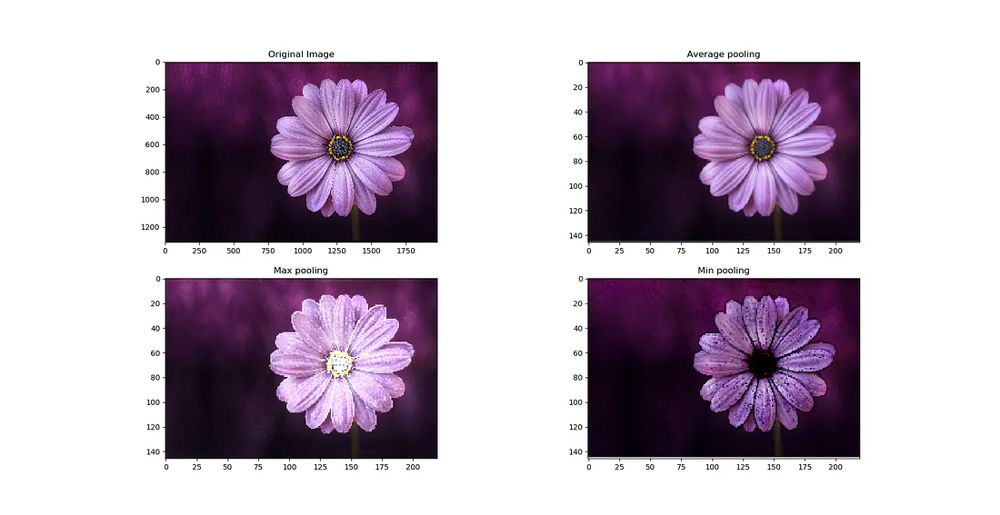

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


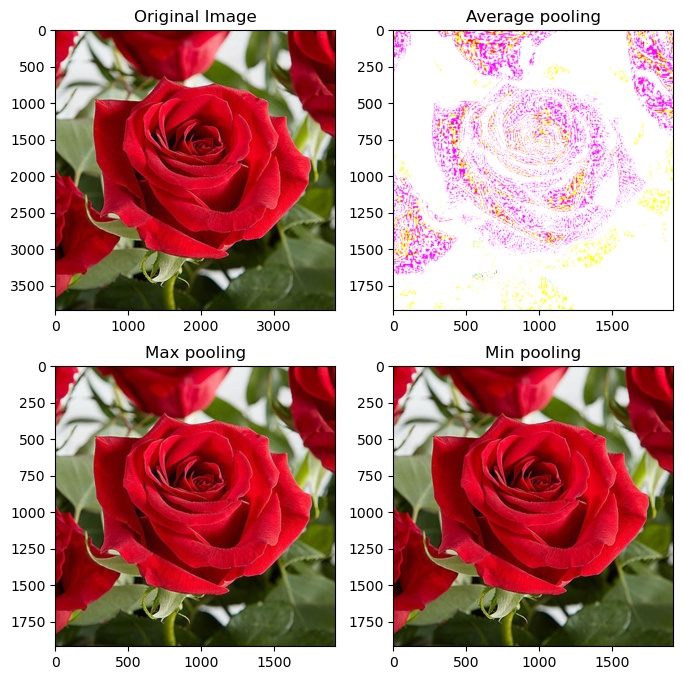

In [11]:
from skimage import io
from skimage.measure import block_reduce
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
plt.figure(figsize=(8,8))
img = io.imread('https://images.contentstack.io/v3/assets/bltcedd8dbd5891265b/blt134818d279038650/6668df6434f6fb5cd48aac34/beautiful-flowers-rose.jpeg?q=70&width=3840&auto=webp')
mean_pool=block_reduce(img, block_size=(2,2,1), func=np.mean)
max_pool=block_reduce(img, block_size=(2,2,1), func=np.max)
min_pool=block_reduce(img, block_size=(2,2,1), func=np.min)

plt.figure(1)
plt.subplot(221)
imgplot = plt.imshow(img)
plt.title('Original Image')

plt.subplot(222)
imgplot3 = plt.imshow(mean_pool)
plt.title('Average pooling')

plt.subplot(223)
imgplot1 = plt.imshow(max_pool)
plt.title('Max pooling')

plt.subplot(224)
imgplot1 = plt.imshow(min_pool)
plt.title('Min pooling')

plt.show()

In [1]:
# Code example
import tensorflow as tf 
from tensorflow import keras
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D, GlobalMaxPooling2D
from keras import Sequential
from keras.datasets import mnist
from sklearn.metrics import confusion_matrix, accuracy_score
import numpy as np

2025-09-03 12:32:47.863503: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-03 12:32:47.905032: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-09-03 12:32:47.905080: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-09-03 12:32:47.907194: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-09-03 12:32:47.914033: I tensorflow/core/platform/cpu_feature_gua

In [2]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

In [3]:
x_train = x_train/255
x_test = x_test/255

In [5]:
model = Sequential()

model.add(Conv2D(32,kernel_size=(3,3),padding='same', activation='relu', input_shape=(28,28,1)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))
model.add(Conv2D(32,kernel_size=(3,3),padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

model.add(Flatten())

model.add(Dense(128,activation='relu'))
model.add(Dense(10,activation='softmax'))

/home/naman/miniforge3/envs/mytf/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-09-03 12:33:12.309065: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1743 MB memory:  -> device: 0, name: NVIDIA GeForce MX230, pci bus id: 0000:01:00.0, compute capability: 6.1


In [6]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 14, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1568)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       200,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 211,690 (826.91 KB)

 Trainable params: 211,690 (826.91 KB)

 Non-trainable params: 0 (0.00 B)

In [7]:
x_train.shape, x_test.shape

((60000, 28, 28), (10000, 28, 28))

In [8]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])

In [9]:
history=model.fit(x_train, y_train, epochs=5, batch_size=20, validation_data=(x_test, y_test))

Epoch 1/5


I0000 00:00:1756883088.019298   18751 service.cc:145] XLA service 0x7ae508009e40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756883088.019342   18751 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce MX230, Compute Capability 6.1
2025-09-03 12:34:48.062139: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-09-03 12:34:48.315268: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


  29/3000 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.2329 - loss: 2.1146 

I0000 00:00:1756883091.778047   18751 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 26s 6ms/step - accuracy: 0.9600 - loss: 0.1299 - val_accuracy: 0.9859 - val_loss: 0.0453
Epoch 2/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.9857 - loss: 0.0442 - val_accuracy: 0.9875 - val_loss: 0.0367
Epoch 3/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.9906 - loss: 0.0298 - val_accuracy: 0.9884 - val_loss: 0.0345
Epoch 4/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.9933 - loss: 0.0209 - val_accuracy: 0.9893 - val_loss: 0.0313
Epoch 5/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - accuracy: 0.9948 - loss: 0.0157 - val_accuracy: 0.9908 - val_loss: 0.0287


In [10]:
y_prob = model.predict(x_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step


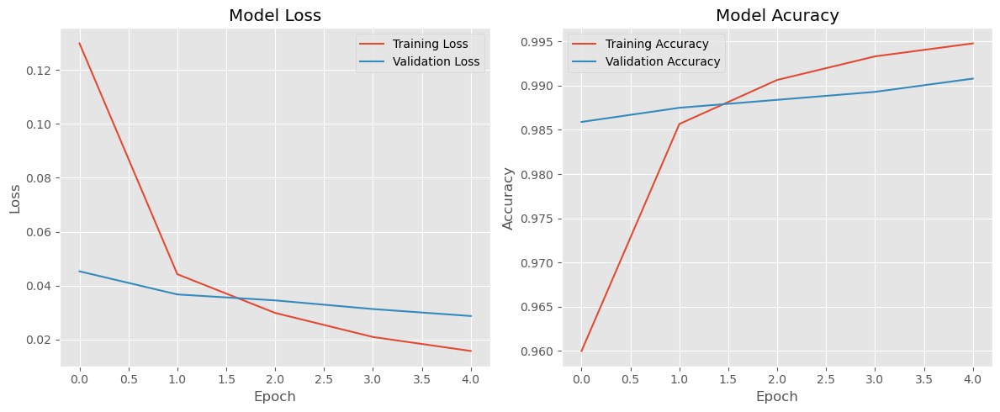

In [11]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')
fig, ax =  plt.subplots(1,2, figsize=(12,5))
ax[0].plot(history.history['loss'], label='Training Loss')
ax[0].plot(history.history['val_loss'], label='Validation Loss')
ax[1].plot(history.history['accuracy'], label='Training Accuracy')
ax[1].plot(history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model Loss')
ax[0].legend()
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Accuracy')
ax[1].set_title('Model Acuracy')
ax[1].legend()
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Prediction:  [0]


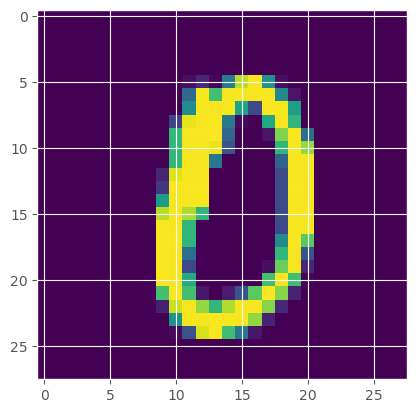

In [13]:
idx = 55
preds = model.predict(x_test[idx].reshape(1,28,28)) 
print("Prediction: ",preds.argmax(axis=1))
plt.imshow(x_test[idx])
plt.show()

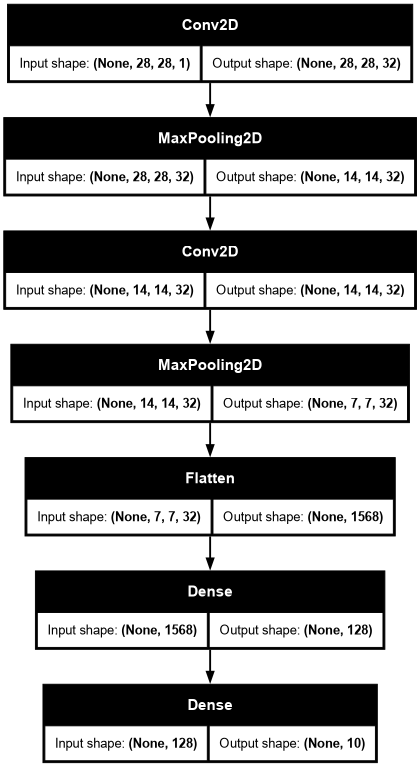

In [14]:
# Visualize CNN architecture
from tensorflow.keras.utils import plot_model

plot_model(model, show_shapes=True, dpi=68)

# LeNet-5 Architecture

## Introduction
In the 1990s, Yann LeCun, Leon Bottou, Yoshua Bengio, and Patrick Haffner proposed the LeNet-5 neural network for character recognition in handwriting and machine printing. Due to its simplicity and clarity, it is often used as an introductory model for understanding Convolutional Neural Networks (CNNs).

LeNet-5 is considered the "Hello World" of CNNs. The backpropagation rule was first applied to real-world applications by Yann LeCun in 1989 at Bell Labs. The researchers argued that imposing domain-specific constraints could improve network generalization. They demonstrated that single-layer networks struggle with generalization, whereas multi-layer networks with feature detectors improve performance.


## What is LeNet-5?
LeNet-5 is a Convolutional Neural Network (CNN) introduced in 1989 by Yann LeCun. It represents the emergence of CNNs and defines their core components. However, at the time, it was not widely adopted due to hardware limitations (lack of GPUs) and alternative algorithms like Support Vector Machines (SVMs) offering similar performance.



## Features of LeNet-5
- Each convolutional layer consists of **convolution, pooling, and non-linear activation functions**.
- **Spatial features** are extracted using convolution (originally called receptive fields).
- **Average pooling** is used for subsampling.
- **Tanh** activation function is used.
- Fully connected layers serve as the final classifier.
- **Sparse connections** between layers reduce computational complexity.


## Architecture of LeNet-5
LeNet-5 consists of **seven layers**: three convolutional layers, two subsampling layers, and two fully connected layers.

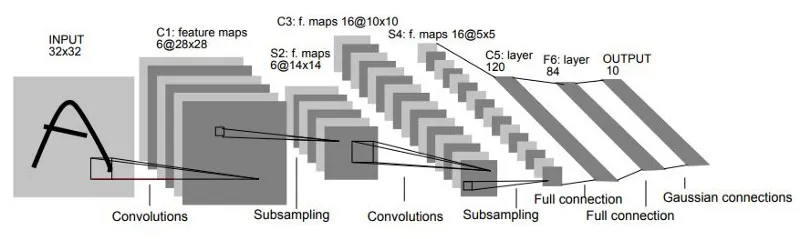

### **First Layer (Input & C1 Convolutional Layer)**
- Input: **32x32 grayscale image**.
- **6 filters**, each **5x5** with **stride 1**.
- Output size: **28x28x6**.

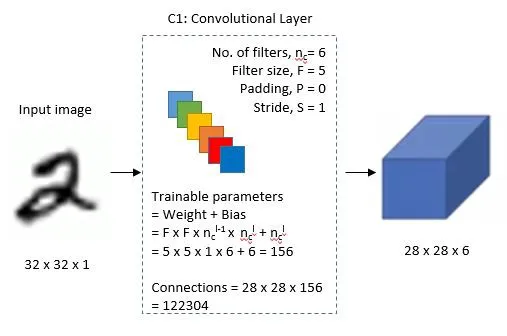

### **Second Layer (S2 Subsampling Layer)**
- **Average pooling** with **2x2 filter**, **stride 2**.
- Output size: **14x14x6**.
- **0 Trainable parameters**


### **Third Layer (C3 Convolutional Layer)**
- **16 filters**, each **5x5** with **stride 1**.
- **16 feature maps** are connected to previous layer’s 6 feature maps to reduce parameters.
- Output size: **10x10x16**.
- Only 10 of the 16 feature maps in this layer are linked to the six feature maps.
 The primary goal is to disrupt the network’s symmetry while maintaining a manageable number of connections. Because of this, there are 1516 training parameters instead of 2400 in these layers, and similarly, there are 151600 connections instead of 240000.



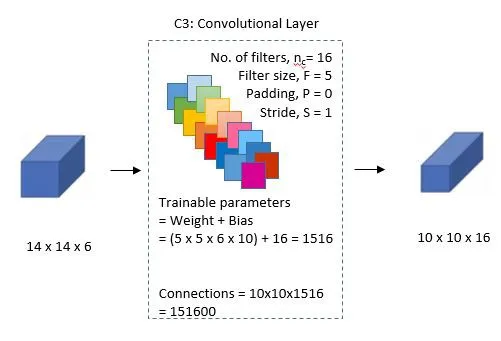



### **Fourth Layer (S4 Subsampling / Pooling Layer)**
- **Average pooling**, **2x2 filter**, **stride 2**.
- Output size: **5x5x16**.

### **Fifth Layer (C5 Fully Connected Convolutional Layer)**
- **120 feature maps**, each **1x1**.
- Every unit in **C5 is connected to all 400 nodes** (5x5x16) from S4.

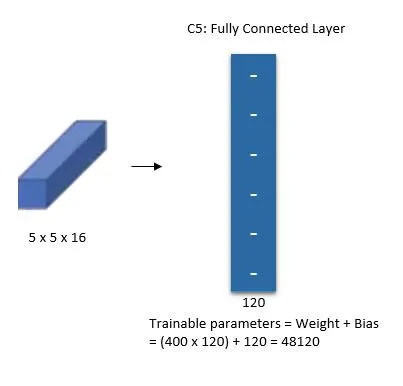


### **Sixth Layer (F6 Fully Connected Layer)**
- **84 units**.

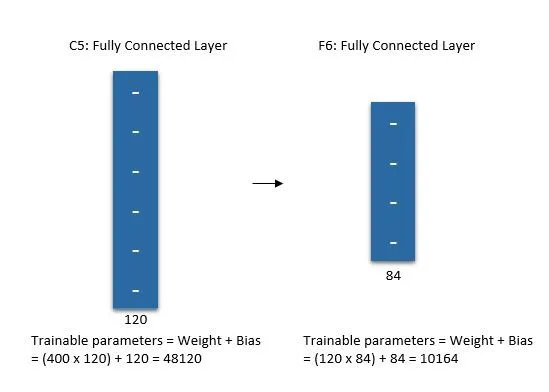


### **Output Layer (Softmax Classifier)**
- **10 units**, representing digits 0-9.

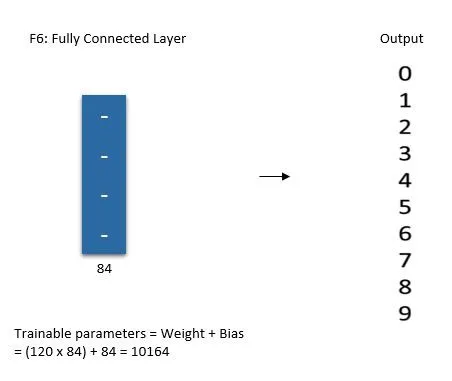


## Layers in LeNet-5

1. **Input Layer**: Takes a grayscale image of size 32x32.
2. **Convolutional Layer 1 (C1)**: Applies 6 filters of size 5x5.
3. **Subsampling/Pooling Layer 1 (S2)**: Applies average pooling with a 2x2 window and stride 2.
4. **Convolutional Layer 2 (C3)**: Applies 16 filters of size 5x5.
5. **Subsampling/Pooling Layer 2 (S4)**: Applies average pooling with a 2x2 window and stride 2.
6. **Fully Connected Layer 1 (C5)**: A dense layer with 120 neurons.
7. **Fully Connected Layer 2 (F6)**: A dense layer with 84 neurons.
8. **Output Layer**: A dense layer with 10 neurons (one for each digit class).



## Input/Output Shapes and Trainable Parameters

### 1. Input Layer
- **Input Shape**: $32 \times 32 \times 1$ (32x32 grayscale image).
- **Output Shape**: $32 \times 32 \times 1$.
- **Trainable Parameters**: 0 (no parameters here).



### 2. Convolutional Layer 1 (C1)
- **Input Shape**: $32 \times 32 \times 1$.
- **Filters**: 6 filters of size $5 \times 5$.
- **Output Shape**: $28 \times 28 \times 6$ (feature maps).
- **Trainable Parameters**:
  - Each filter has $5 \times 5 = 25$ weights and 1 bias.
  - Total parameters: $6 \times (25 + 1) = 156$.



### 3. Subsampling Layer 1 (S2)
- **Input Shape**: $28 \times 28 \times 6$.
- **Pooling**: Average pooling with a $2 \times 2$ window and stride 2.
- **Output Shape**: $14 \times 14 \times 6$.
- **Trainable Parameters**: 0 (fixed pooling operation).



### 4. Convolutional Layer 2 (C3)
- **Input Shape**: $14 \times 14 \times 6$.
- **Filters**: 16 filters of size $5 \times 5$.
- **Output Shape**: $10 \times 10 \times 16$ (feature maps).
- **Trainable Parameters**:
  - Each filter connects to a subset of the previous layer's feature maps (not all 6).
  - Typically, each of the 16 filters has $5 \times 5 \times 6 = 150$ weights and 1 bias.
  - Total parameters: $10 \times (150) + 16 = 1,516$.



### 5. Subsampling Layer 2 (S4)
- **Input Shape**: $10 \times 10 \times 16$.
- **Pooling**: Average pooling with a $2 \times 2$ window and stride 2.
- **Output Shape**: $5 \times 5 \times 16$.
- **Trainable Parameters**: 0 (fixed pooling operation).



### 6. Fully Connected Layer 1 (C5)
- **Input Shape**: $5 \times 5 \times 16$ (flattened to $400$).
- **Output Shape**: $120$ (neurons).
- **Trainable Parameters**:
  - Each neuron has 400 weights and 1 bias.
  - Total parameters: $120 \times (400 + 1) = 48,120$.



### 7. Fully Connected Layer 2 (F6)
- **Input Shape**: $120$.
- **Output Shape**: $84$ (neurons).
- **Trainable Parameters**:
  - Each neuron has 120 weights and 1 bias.
  - Total parameters: $84 \times (120 + 1) = 10,164$.



### 8. Output Layer
- **Input Shape**: $84$.
- **Output Shape**: $10$ (neurons, one for each digit class).
- **Trainable Parameters**:
  - Each neuron has 84 weights and 1 bias.
  - Total parameters: $10 \times (84 + 1) = 850$.



## Total Trainable Parameters

Adding up all the trainable parameters:
- C1: 156
- C3: 2,416
- C5: 48,120
- F6: 10,164
- Output Layer: 850

**Total Trainable Parameters: ~61,706**.


<table>
  <thead>
    <tr>
      <th>Layer</th>
      <th>Input Shape</th>
      <th>Output Shape</th>
      <th>Trainable Parameters</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>Input Layer</td>
      <td>32×32×1</td>
      <td>32×32×1</td>
      <td>0</td>
    </tr>
    <tr>
      <td>Convolutional C1</td>
      <td>32×32×1</td>
      <td>28×28×6</td>
      <td>156</td>
    </tr>
    <tr>
      <td>Subsampling S2</td>
      <td>28×28×6</td>
      <td>14×14×6</td>
      <td>0</td>
    </tr>
    <tr>
      <td>Convolutional C3</td>
      <td>14×14×6</td>
      <td>10×10×16</td>
      <td>1,516</td>
    </tr>
    <tr>
      <td>Subsampling S4</td>
      <td>10×10×16</td>
      <td>5×5×16</td>
      <td>0</td>
    </tr>
    <tr>
      <td>Fully Connected C5</td>
      <td>400 (flattened)</td>
      <td>120</td>
      <td>48,120</td>
    </tr>
    <tr>
      <td>Fully Connected F6</td>
      <td>120</td>
      <td>84</td>
      <td>10,164</td>
    </tr>
    <tr>
      <td>Output Layer</td>
      <td>84</td>
      <td>10</td>
      <td>850</td>
    </tr>
    <tr>
      <td colspan="3"><strong>Total Trainable Parameters</strong></td>
      <td><strong>60,806</strong></td>
    </tr>
  </tbody>
</table>

**Total Trainable Parameters: 61,706**.


<table>
<tr>
<th colspan="2">TimeLine</th>
</tr>
<tr><td>1989</td>   <td>Yann LeCun et al. proposed the original form of LeNet (LeNet-1)</tr>
<tr><td>1989</td>	<td>Yann LeCun demonstrates that minimizing the number of free parameters in neural networks can enhance the generalization ability of neural networks.</tr>
<tr><td>1990</td>	<td>Application of backpropagation to LeNet-1 in handwritten digit recognition.</tr>
<tr><td>1994</td>	<td>MNIST database and LeNet-4 developed</tr>
<tr><td>1995</td>	<td>LeNet-5 developed, various methods applied to handwritten character recognition reviewed and compared with standard handwritten digit recognition benchmarks. The results show that convolutional neural networks outperform all other models.</tr>
<tr><td>1998</td>	<td>Practical applications</tr>
</table>

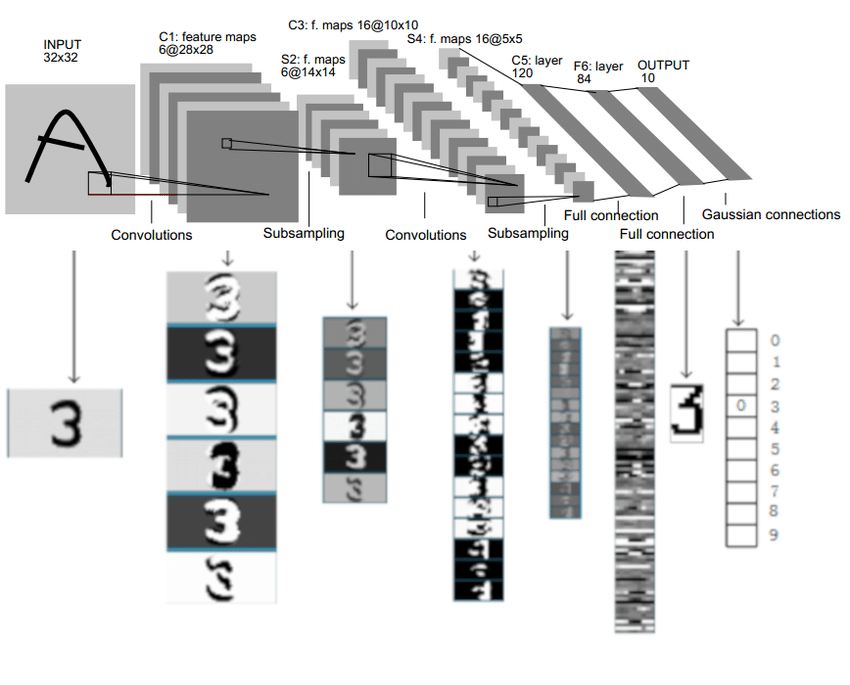

In [15]:
## **Implementing LeNet-5 on the MNIST Dataset**
## We will implement LeNet-5 on the MNIST dataset, which contains **28x28** grayscale images of handwritten digits.


import tensorflow as tf
import numpy as np

mnist = tf.keras.datasets.mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# Reshape data to 4D tensors
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
x_test = x_test.reshape(x_test.shape[0], 28, 28, 1)

# Normalize pixel values to [0,1]
x_train, x_test = x_train.astype('float32') / 255.0, x_test.astype('float32') / 255.0

# Convert labels to one-hot encoding
y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)

In [16]:
import tensorflow
import matplotlib.pyplot as plt
from tensorflow import keras
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D, GlobalMaxPooling2D, AveragePooling2D
from keras import Sequential
from keras.datasets import mnist
from sklearn.metrics import confusion_matrix, accuracy_score


Epoch 1/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - accuracy: 0.8861 - loss: 0.4121
Epoch 2/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9510 - loss: 0.1662
Epoch 3/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9669 - loss: 0.1104
Epoch 4/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9750 - loss: 0.0841
Epoch 5/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9794 - loss: 0.0690
Epoch 6/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9821 - loss: 0.0598
Epoch 7/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9837 - loss: 0.0525
Epoch 8/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9861 - loss: 0.0467
Epoch 9/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9872 - loss: 0.0420
Epoch 10/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9881 - loss: 0.0387
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9835 - loss: 0.0493
Accuracy: 0.9835000038146973


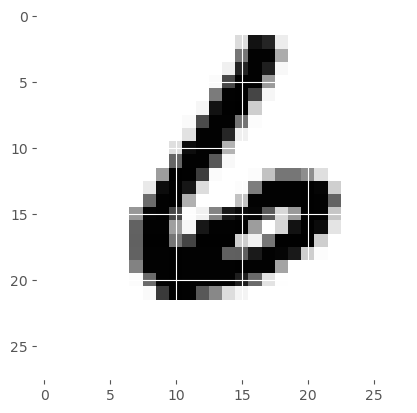

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 837ms/step
Predicted Label: 6


In [18]:
def build_lenet(input_shape):
    model = tf.keras.Sequential()
    
    # C1 Convolution Layer
    model.add(Conv2D(filters=6, kernel_size=(5,5), padding = 'valid', strides=(1,1), activation='tanh', input_shape=input_shape))
    
    # S2 Subsampling Layer
    model.add(AveragePooling2D(pool_size=(2,2), strides=(2,2)))
    
    # C3 Convolution Layer
    model.add(Conv2D(filters=16, kernel_size=(5,5), padding='valid', strides=(1,1), activation='tanh'))
    
    # S4 Subsampling Layer
    model.add(AveragePooling2D(pool_size=(2,2), strides=(2,2)))
    
    # Flatten Layer
    model.add(Flatten())
    
    # C5 Fully Connected Layer
    model.add(Dense(units=120, activation='tanh'))
    
    # F6 Fully Connected Layer
    model.add(Dense(units=84, activation='tanh'))
    
    # Output Layer
    model.add(Dense(units=10, activation='softmax'))
    
    # Compile Model
    model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.SGD(learning_rate=0.1), metrics=['accuracy'])
    
    return model

lenet = build_lenet((28, 28, 1))

# Train Model
epochs = 10
history = lenet.fit(x_train, y_train, epochs=epochs, batch_size=128, verbose=1)

# Evaluate Model
loss, acc = lenet.evaluate(x_test, y_test)
print('Accuracy:', acc)

# Reshape training data
x_train = x_train.reshape(x_train.shape[0], 28, 28)
x_test = x_test.reshape(x_test.shape[0], 28, 28)

# Plot an image
image_index = 8888
plt.imshow(x_test[image_index], cmap='Greys')
plt.show()

# Make Prediction
pred = lenet.predict(x_test[image_index].reshape(1, 28, 28, 1))
print('Predicted Label:', pred.argmax())

## AlexNet
AlexNet is an Image Classification model that transformed deep learning. It was introduced by Geoffrey Hinton and his team in 2012, and marked a key event in the history of deep learning, showcasing the strengths of CNN architectures and its vast applications.

Before AlexNet, people were skeptical about whether deep learning could be applied successfully to very large datasets. However, a team of researchers were driven to prove that Deep Neural Architectures were the future, and succeeded in it; AlexNet exploded the interest in deep learning post-2012.

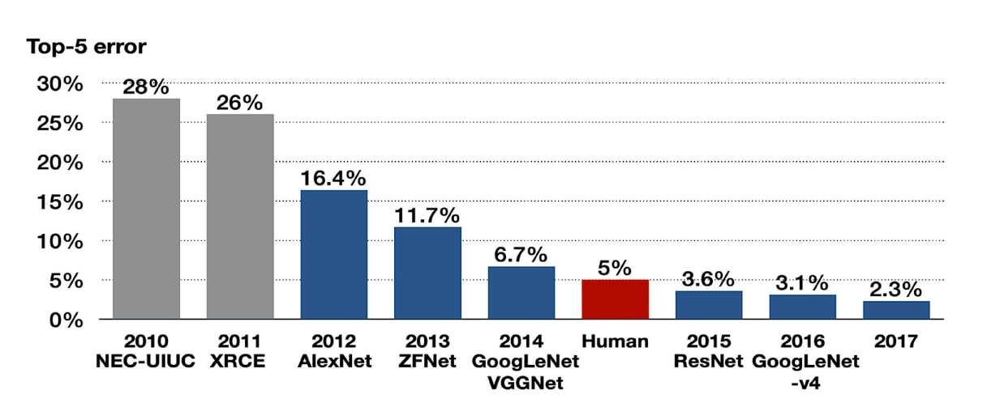

The Deep Learning (DL) model was designed to compete in the ImageNet Large Scale Visual Recognition Challenge (ILSVRC) in 2012. This is an annual competition that benchmarks algorithms for image classification. Before ImageNet, there was no availability of a large dataset to train Deep Neural Networks. 

ImageNet is a vast visual database designed for object recognition research. It consists of over 14 million hand-annotated images with over 20,000 categories. This dataset played a major role in the success of AlexNet and the advancements in DL,

The AlexNet paper titled “ImageNet Classification with Deep Convolutional Neural Networks” solved the Image-classification problems.

This paper’s release deeply influenced the trajectory of deep learning. The methods and innovation introduced became a standard for training Deep Neural Networks. Here are the key innovations introduced:

- **Deep Architecture**: This model utilized deep architecture compared to any NN model released previously. It consisted of five convolutional layers followed by three fully connected layers.
- **ReLU Nonlinearity**: CNNs at that time used functions such as Tanh or Sigmoid to process information between layers. These functions slowed down the training. In contrast, ReLU (Rectified Linear Unit) made the entire process simpler and many times faster. It outputs only if the input is given to it as positive, otherwise it outputs a zero.
- **Overlapping Pooling**: Overlapping pooling is just like regular max pooling layers, but, in overlap pooling, as the window moves across, it overlaps with the previous window. This improved the error percentage in AlexNet.
- **Use of GPU**: Before AlexNet, NNs were trained on the CPU, which made the process slow. However, the researcher of AlexNet incorporated GPUs, which accelerated computation time significantly. This proved that Deep NNs can be trained feasibly on GPUs.
- **Local Response Normalization (LRN)**: This is a process of normalizing adjacent channels in the network, which normalizes the activity of neurons within a local neighborhood.


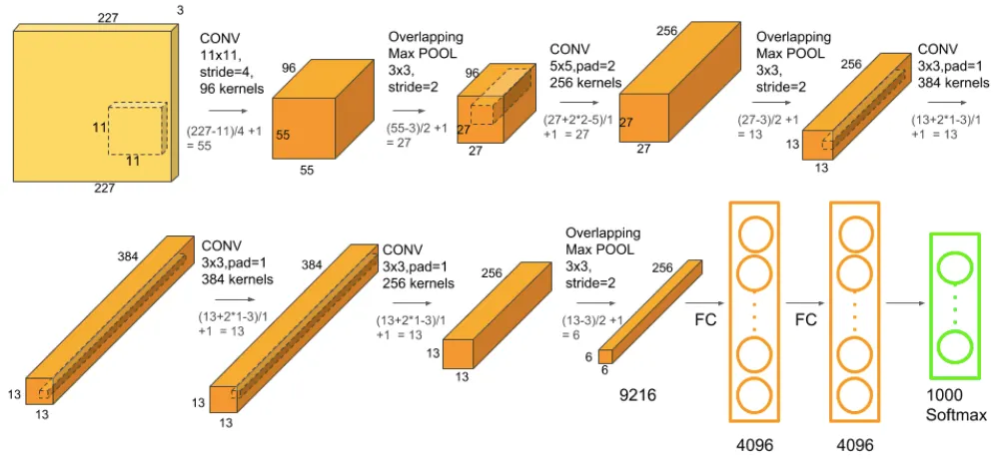

AlexNet comprises a rather simple architecture compared to the latest Deep Learning Models. It consists of 8 layers: 5 convolutional layers and 3 fully connected layers.

However, it integrates several key innovations of its time, including the ReLU Activation Functions, Local Response Normalization (LRN), and Overlapping Max Pooling. 

### **🔹 Input Layer**

AlexNet takes images of the Input size of 227x227x3 RGB Pixels.

**Number of Classes:** $1000$ (for ImageNet)


### **🔹 Layer 1: Conv1**
- **Filter Size:** $11 \times 11 \times 3$  
- **Number of Filters:** $96$  
- **Stride:** $4$  
- **Padding:** $0$  
- **Activation:** ReLU  

#### **Output Shape Calculation**
$$
O = \frac{(I - F + 2P)}{S} + 1
$$
$$
O = \frac{(227 - 11 + 2(0))}{4} + 1 = \frac{217}{4} + 1 = 55
$$
**Output Shape:** $55 \times 55 \times 96$

#### **Trainable Parameters Calculation**
Each filter has $11 \times 11 \times 3$ weights + 1 bias term.

$$
(11 \times 11 \times 3) \times 96 + 96 = 34,944
$$



### **🔹 Layer 2: Max Pooling**
- **Filter Size:** $3 \times 3$  
- **Stride:** $2$  

#### **Output Shape Calculation**
$$
O = \frac{(55 - 3)}{2} + 1 = \frac{52}{2} + 1 = 27
$$
**Output Shape:** $27 \times 27 \times 96$



### **🔹 Layer 3: Conv2**
- **Filter Size:** $5 \times 5 \times 96$  
- **Number of Filters:** $256$  
- **Stride:** $1$  
- **Padding:** $2$  
- **Activation:** ReLU  

#### **Output Shape Calculation**
$$
O = \frac{(27 - 5 + 2(2))}{1} + 1 = \frac{27 - 5 + 4}{1} + 1 = 27
$$
**Output Shape:** $27 \times 27 \times 256$

#### **Trainable Parameters Calculation**
$$
(5 \times 5 \times 96) \times 256 + 256 = (2400 \times 256) + 256 = 614,656
$$



### **🔹 Layer 4: Max Pooling**
- **Filter Size:** $3 \times 3$  
- **Stride:** $2$  

#### **Output Shape Calculation**
$$
O = \frac{(27 - 3)}{2} + 1 = \frac{24}{2} + 1 = 13
$$
**Output Shape:** $13 \times 13 \times 256$



### **🔹 Layer 5: Conv3**
- **Filter Size:** $3 \times 3 \times 256$  
- **Number of Filters:** $384$  
- **Stride:** $1$  
- **Padding:** $1$  
- **Activation:** ReLU  

#### **Output Shape Calculation**
$$
O = \frac{(13 - 3 + 2(1))}{1} + 1 = 13
$$
**Output Shape:** $13 \times 13 \times 384$

#### **Trainable Parameters Calculation**
$$
(3 \times 3 \times 256) \times 384 + 384 = (2304 \times 384) + 384 = 885,120
$$



### **🔹 Layer 6: Conv4**
- **Filter Size:** $3 \times 3 \times 384$  
- **Number of Filters:** $384$  
- **Stride:** $1$  
- **Padding:** $1$  
- **Activation:** ReLU  

#### **Output Shape Calculation**
$$
O = \frac{(13 - 3 + 2(1))}{1} + 1 = 13
$$
**Output Shape:** $13 \times 13 \times 384$

#### **Trainable Parameters Calculation**
$$
(3 \times 3 \times 384) \times 384 + 384 = (3456 \times 384) + 384 = 1,327,488
$$



### **🔹 Layer 7: Conv5**
- **Filter Size:** $3 \times 3 \times 384$  
- **Number of Filters:** $256$  
- **Stride:** $1$  
- **Padding:** $1$  
- **Activation:** ReLU  

#### **Output Shape Calculation**
$$
O = \frac{(13 - 3 + 2(1))}{1} + 1 = 13
$$
**Output Shape:** $13 \times 13 \times 256$

#### **Trainable Parameters Calculation**
$$
(3 \times 3 \times 384) \times 256 + 256 = (3456 \times 256) + 256 = 884,992
$$



### **🔹 Layer 8: Max Pooling**
- **Filter Size:** $3 \times 3$  
- **Stride:** $2$  

#### **Output Shape Calculation**
$$
O = \frac{(13 - 3)}{2} + 1 = 6
$$
**Output Shape:** $6 \times 6 \times 256$

### **🔹 Flattening**
$$ 6 \times 6 \times 256 = 9216$$

### **🔹 Layer 9: Fully Connected (FC6)**
$$
9216 \times 4096 + 4096 = 37,752,832
$$



### **🔹 Layer 10: Fully Connected (FC7)**
$$
4096 \times 4096 + 4096 = 16,781,312
$$



### **🔹 Layer 11: Fully Connected (FC8 - Output Layer)**
$$
4096 \times 1000 + 1000 = 4,097,000
$$



## **📌 Total Trainable Parameters**
Summing all the parameters:

$$
34,944 + 614,656 + 885,120 + 1,327,488 + 884,992 + 37,752,832 + 16,781,312 + 4,097,000 = 60,965,224
$$

🔹 **Total Parameters:** **~61 million** 🚀

In [19]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [20]:
tf.test.is_gpu_available()

2025-09-03 12:45:06.083919: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /device:GPU:0 with 1743 MB memory:  -> device: 0, name: NVIDIA GeForce MX230, pci bus id: 0000:01:00.0, compute capability: 6.1


True

In [21]:
# clear memory
import gc
tf.keras.backend.clear_session()
gc.collect()

0

In [22]:
# Load CIFAR-10 dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# Print dataset shapes
print("Training data shape:", x_train.shape)  # (50000, 32, 32, 3)
print("Testing data shape:", x_test.shape)    # (10000, 32, 32, 3)
print("Training labels shape:", y_train.shape)  # (50000, 1)
print("Testing labels shape:", y_test.shape)    # (10000, 1)

# Number of classes
num_classes = 10

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 26s 0us/step
Training data shape: (50000, 32, 32, 3)
Testing data shape: (10000, 32, 32, 3)
Training labels shape: (50000, 1)
Testing labels shape: (10000, 1)


The CIFAR-100 dataset (Canadian Institute for Advanced Research, 100 classes) is a subset of the Tiny Images dataset and consists of 60000 32x32 color images. 

The 100 classes in the CIFAR-100 are grouped into 20 superclasses. There are 600 images per class.

In [23]:
# Convert NumPy arrays to TensorFlow dataset
## tf.data.Dataset.from_tensor_slices() if you want a separate row for each input tensor
## example tf.data.Dataset.from_tensor_slices((np.array([[[1]], [[2]], [[3]]]), np.array([[10], [20], [30]])))
train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test))

2025-09-03 12:49:39.068818: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


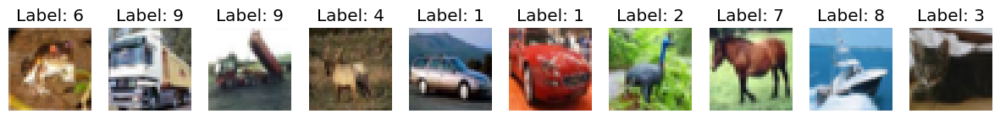

In [24]:
# Exploratory Data Analysis (EDA)

plt.figure(figsize=(15, 15))
for i, (image, label) in enumerate(train_ds.take(10)):
    plt.subplot(10, 10, i+1)
    plt.imshow(image.numpy())
    plt.title(f"Label: {label.numpy()[0]}")
    plt.axis("off")
plt.show()

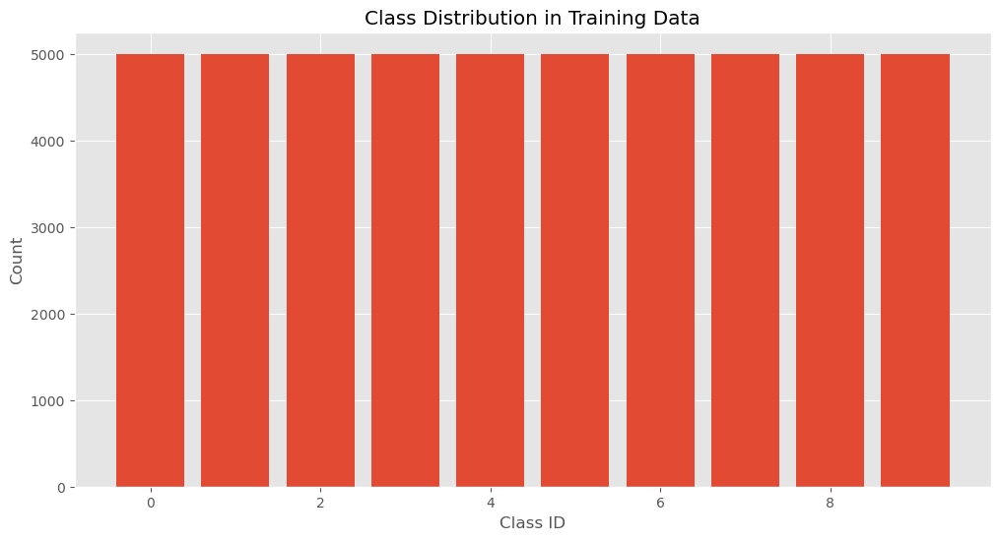

In [8]:
# **Class Distribution in Training Data**
all_labels = np.concatenate(list(train_ds.map(lambda x, y: y).as_numpy_iterator()))  # Extract all labels

unique, counts = np.unique(all_labels, return_counts=True)
plt.figure(figsize=(12, 6))
plt.style.use('ggplot')
plt.bar(unique, counts)
plt.title("Class Distribution in Training Data")
plt.xlabel("Class ID")
plt.ylabel("Count")
plt.show()

In [9]:
# Function to resize images one by one
def preprocess(image, label):
    image = tf.image.resize(image, (227, 227)) / 255.0  # Normalize after resizing
    label = tf.one_hot(tf.cast(label, tf.int32), depth=num_classes)  # Convert to one-hot
    label = tf.squeeze(label)  # Remove extra dimension (50000, 1, 10) → (50000, 10)
    return image, label
    
train_ds = train_ds.map(preprocess).batch(32).prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.map(preprocess).batch(32).prefetch(tf.data.AUTOTUNE)

In [10]:
train_ds_unbatched = train_ds.unbatch()
test_ds_unbatched = test_ds.unbatch()

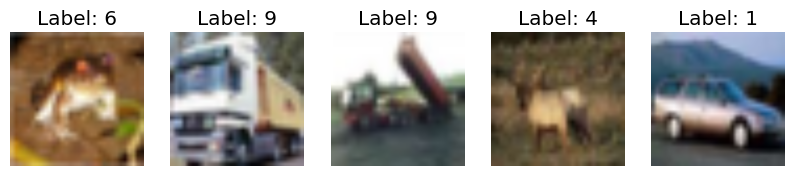

In [11]:
plt.figure(figsize=(10, 5))
for i, (image, label) in enumerate(train_ds_unbatched.take(5)):  
    plt.subplot(1, 5, i+1)
    plt.imshow(image.numpy())
    plt.title(f"Label: {tf.argmax(label).numpy()}")  # Convert one-hot back to class ID
    plt.axis("off")
plt.show()

In [12]:
# Building alexnet
def build_alexnet(input_shape=(227, 227, 3), num_classes=num_classes):
    model = models.Sequential([
        # Layer 1: Conv -> ReLU -> MaxPool
        layers.Conv2D(96, (11, 11), strides=4, padding='valid', activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((3, 3), strides=2),

        # Layer 2: Conv -> ReLU -> MaxPool
        layers.Conv2D(256, (5, 5), padding='same', activation='relu'),
        layers.MaxPooling2D((3, 3), strides=2),

        # Layer 3: Conv -> ReLU
        layers.Conv2D(384, (3, 3), padding='same', activation='relu'),

        # Layer 4: Conv -> ReLU
        layers.Conv2D(384, (3, 3), padding='same', activation='relu'),

        # Layer 5: Conv -> ReLU -> MaxPool
        layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
        layers.MaxPooling2D((3, 3), strides=2),

        # Flatten
        layers.Flatten(),

        # Fully Connected Layers
        layers.Dense(4096, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(4096, activation='relu'),
        layers.Dropout(0.5),

        # Output Layer
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Build the model
model = build_alexnet()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 55, 55, 96)        34944     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 27, 27, 96)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 27, 27, 256)       614656    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 13, 13, 256)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 13, 13, 384)       885120    
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 13, 13, 384)       1327488   
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 13, 13, 256)       8

In [13]:
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [14]:
history = model.fit(train_ds,epochs=20,validation_data=test_ds,verbose=1)

Epoch 1/20
1563/1563 [==============================] - 48s 24ms/step - loss: 1.8584 - accuracy: 0.3114 - val_loss: 1.5870 - val_accuracy: 0.4194
Epoch 2/20
1563/1563 [==============================] - 37s 24ms/step - loss: 1.5062 - accuracy: 0.4521 - val_loss: 1.4079 - val_accuracy: 0.4912
Epoch 3/20
1563/1563 [==============================] - 38s 24ms/step - loss: 1.3741 - accuracy: 0.5050 - val_loss: 1.3172 - val_accuracy: 0.5232
Epoch 4/20
1563/1563 [==============================] - 39s 25ms/step - loss: 1.2806 - accuracy: 0.5446 - val_loss: 1.2957 - val_accuracy: 0.5315
Epoch 5/20
1563/1563 [==============================] - 39s 25ms/step - loss: 1.2116 - accuracy: 0.5689 - val_loss: 1.2303 - val_accuracy: 0.5503
Epoch 6/20
1563/1563 [==============================] - 40s 25ms/step - loss: 1.1516 - accuracy: 0.5926 - val_loss: 1.2141 - val_accuracy: 0.5704
Epoch 7/20
1563/1563 [==============================] - 40s 26ms/step - loss: 1.1117 - accuracy: 0.6057 - val_loss: 1.1700 -

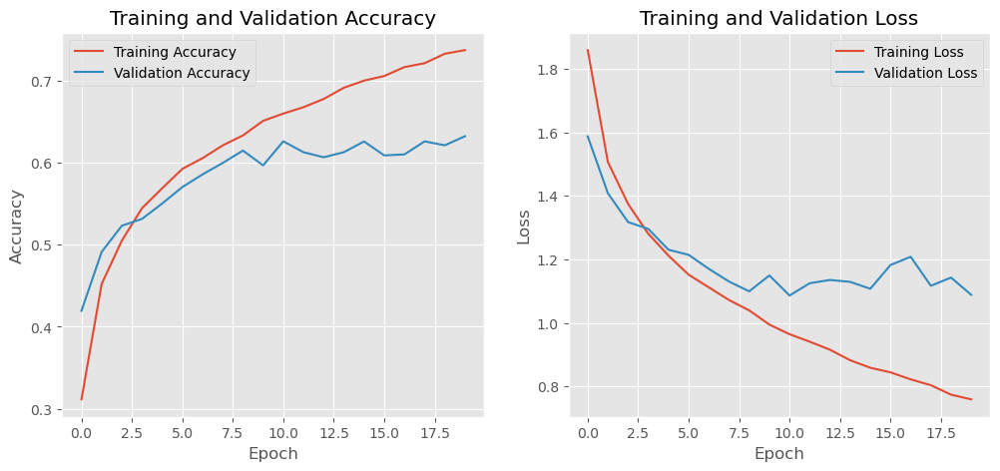

In [15]:
## Evaluating the model
# Plot accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


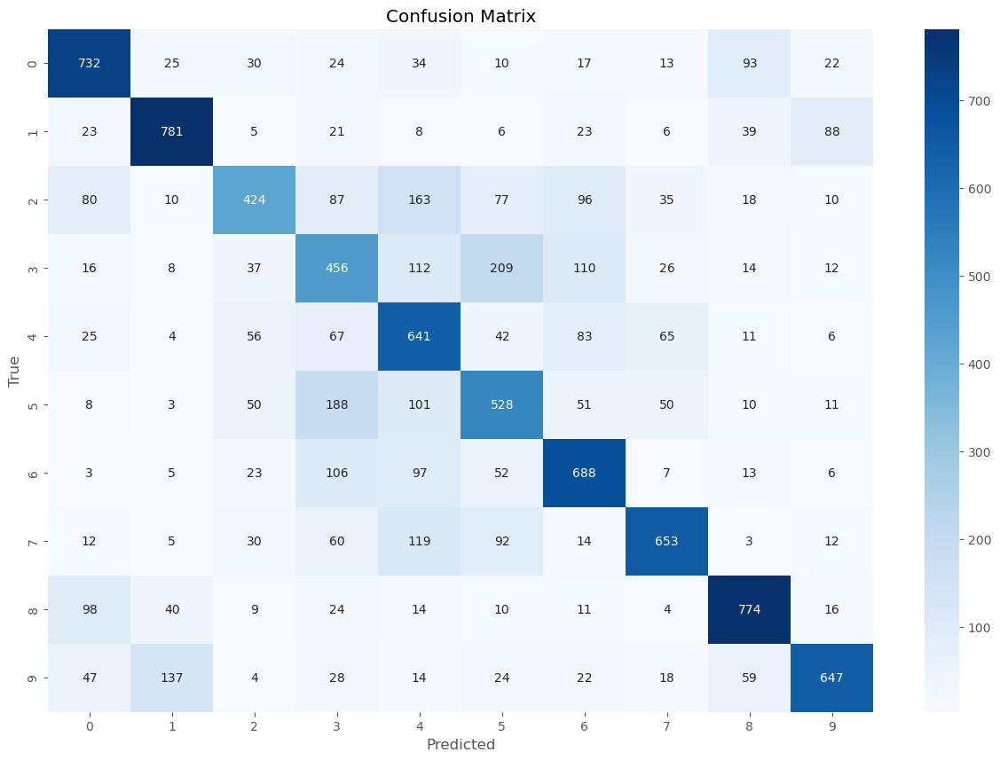

In [25]:
y_pred = []
y_true = []

for images, labels in test_ds:
    preds = model.predict(images)  # Predict batch
    y_pred.append(np.argmax(preds, axis=1))  # Convert to class labels
    y_true.append(np.argmax(labels.numpy(), axis=1))  # Convert true labels

y_pred_classes = np.concatenate(y_pred, axis=0)
y_true_classes = np.concatenate(y_true, axis=0)

cm = confusion_matrix(y_true_classes, y_pred_classes)

plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [27]:
print(classification_report(y_true_classes, y_pred_classes, target_names=[str(i) for i in range(10)]))

              precision    recall  f1-score   support

           0       0.70      0.73      0.72      1000
           1       0.77      0.78      0.77      1000
           2       0.63      0.42      0.51      1000
           3       0.43      0.46      0.44      1000
           4       0.49      0.64      0.56      1000
           5       0.50      0.53      0.52      1000
           6       0.62      0.69      0.65      1000
           7       0.74      0.65      0.70      1000
           8       0.75      0.77      0.76      1000
           9       0.78      0.65      0.71      1000

    accuracy                           0.63     10000
   macro avg       0.64      0.63      0.63     10000
weighted avg       0.64      0.63      0.63     10000



In [24]:
model.save('alexnet_cifar100.h5')